<a href="https://colab.research.google.com/github/DIvyesh0204/TransferLearning-obj_detection/blob/master/transferlearn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.4.1


In [4]:
cd content/drive/

[Errno 2] No such file or directory: 'content/drive/'
/content


In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from six import BytesIO
from io import StringIO
import os
import _pickle as cPickle
import cv2
from pathlib import Path
import tensorflow as tf
%matplotlib inline

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tensorflow-gpu

In [ ]:
!git clone https://github.com/tensorflow/models.git

# New Section

In [ ]:
pwd 

'/content'

In [ ]:
cd /content/models/research

/content/models/research


In [ ]:
pwd

'/content/models/research'

In [ ]:
!protoc object_detection/protos/*.proto --python_out=.

In [ ]:
!git clone https://github.com/cocodataset/cocoapi.git

In [ ]:
cd cocoapi/PythonAPI

/content/models/research/cocoapi/PythonAPI


In [ ]:
!make

In [ ]:
cp -r pycocotools /content/models/research

In [ ]:
cd ..

/content/models/research/cocoapi


Tensorflow object detection installation

In [ ]:
cd /content

/content


In [ ]:
mkdir trainingdemo

In [ ]:
pwd

'/content'

In [ ]:
cd /content/trainingdemo

/content/trainingdemo


In [ ]:
mkdir annotations

In [ ]:
mkdir exported-models

In [ ]:
mkdir images

In [ ]:
mkdir pre-trainedmodels

In [ ]:
cd /content/models/research

In [ ]:
cp object_detection/packages/tf2/setup.py .

In [ ]:
!python -m pip install .

In [ ]:
!python object_detection/builders/model_builder_tf2_test.py

In [ ]:
from object_detection.utils import colab_utils
from object_detection.utils import visualization_utils as viz_utils

In [ ]:
!mv "/content/trainingdemo/images" "/content/models/research/object_detection/test_images/ducky/test" 

In [ ]:
!mv "/content/trainingdemo/images" "/content/models/research/object_detection/test_images/ducky/train" 

In [ ]:
cd /content/trainingdemo/pre-trainedmodels

In [ ]:
cd /content/trainingdemo/images/train

In [ ]:
cd /content/trainingdemo/pre-trainedmodels

/content/trainingdemo/pre-trainedmodels


In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

In [ ]:
!tar -xvf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

In [ ]:
cd /content/trainingdemo/images

/content/trainingdemo/images


In [ ]:
mkdir train

In [ ]:
mkdir test

In [ ]:
for i in range(5):
    datax[i].reshape(640,853,3)

image_np=np.array(datax)

In [ ]:
len(datax)

5

In [ ]:
boxes=[]
colab_utils.annotate(datax,box_storage_pointer=boxes)

<IPython.core.display.Javascript object>

In [ ]:
boxes

In [ ]:

category_index= {
      1: {'id' :1, 'name':'duck'}
}


In [ ]:
cd /content/trainingdemo/annotations

/content/trainingdemo/annotations


In [ ]:
cd /content/

/content


In [ ]:
cd /content/

/content


In [ ]:
cd /content/trainingdemo/

/content/trainingdemo


In [ ]:
!python generate_tfrecord.py -x /content/trainingdemo/images/train -l /content/trainingdemo/annotations/label_map.pbtxt -o /content/trainingdemo/annotations/train.record

# Create test data:
!python generate_tfrecord.py -x /content/trainingdemo/images/test -l /content/trainingdemo/annotations/label_map.pbtxt -o /content/trainingdemo/annotations/test.record

# For example
# python generate_tfrecord.py -x C:/Users/sglvladi/Documents/Tensorflow/workspace/training_demo/images/train -l C:/Users/sglvladi/Documents/Tensorflow/workspace/training_demo/annotations/label_map.pbtxt -o C:/Users/sglvladi/Documents/Tensorflow/workspace/training_demo/annotations/train.record
# python generate_tfrecord.py -x C:/Users/sglvladi/Documents/Tensorflow/workspace/training_demo/images/test -l C:/Users/sglvladi/Documents/Tensorflow2/workspace/training_demo/annotations/label_map.pbtxt -o C:/Users/sglvladi/Documents/Tensorflow/workspace/training_demo/annotations/test.record

Successfully created the TFRecord file: /content/trainingdemo/annotations/train.record
Successfully created the TFRecord file: /content/trainingdemo/annotations/test.record


In [ ]:
cd /content/trainingdemo/

/content/trainingdemo


In [ ]:
mkdir models

In [ ]:
cd models

/content/trainingdemo/models


In [ ]:
mkdir my_ssd_resnet50_v1_fpn

mkdir: cannot create directory ‘my_ssd_resnet50_v1_fpn’: File exists


In [ ]:
cd /content/trainingdemo

/content/trainingdemo


In [ ]:
pwd

'/content/trainingdemo'

In [ ]:
ls

annotations/                generate_tfrecord.py  partition_dataset.py
exported-models/            images/               pre-trainedmodels/
exporter_main_v2.py         model_main_tf2.py
export_tflite_graph_tf2.py  models/


In [ ]:
!python model_main_tf2.py --model_dir=/content/trainingdemo/models/my_ssd_resnet50_v1_fpn --pipeline_config_path=/content/trainingdemo/models/my_ssd_resnet50_v1_fpn/pipeline.config

In [ ]:
pwd

'/content/trainingdemo'

In [ ]:
cd /content/trainingdemo/exported-models/

In [ ]:
mkdir my_model

In [ ]:
mkdir my_model

In [ ]:
cd /content/trainingdemo/

/content/trainingdemo


In [ ]:
ls

annotations/                generate_tfrecord.py  partition_dataset.py
exported-models/            images/               pre-trainedmodels/
exporter_main_v2.py         model_main_tf2.py
export_tflite_graph_tf2.py  models/


In [ ]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path  /content/trainingdemo/models/my_ssd_resnet50_v1_fpn/pipeline.config --trained_checkpoint_dir /content/trainingdemo/models/my_ssd_resnet50_v1_fpn --output_directory /content/trainingdemo/exported-models/my_model

In [ ]:
cd /content/trainingdemo/

/content/trainingdemo


In [ ]:
PATH_TO_LABELS =  '/content/trainingdemo/annotations/label_map.pbtxt'
IMAGE_PATH=[]
path='/content/trainingdemo/images/test/'
for file in os.listdir(path):
    if file.endswith(".jpg"):
       IMAGE_PATH.append(path+file)
IMAGE_PATH[0]

'/content/trainingdemo/images/test/out34.jpg'

In [ ]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

PATH_TO_MODEL_DIR='/content/trainingdemo/exported-models/my_model'

PATH_TO_CFG = PATH_TO_MODEL_DIR + "/pipeline.config"
PATH_TO_CKPT = PATH_TO_MODEL_DIR + "/checkpoint"

print('Loading model... ', end='')
start_time = time.time()

# Load pipeline config and build a detection model
configs = config_util.get_configs_from_pipeline_file(PATH_TO_CFG)
model_config = configs['model']
detection_model = model_builder.build(model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(PATH_TO_CKPT, 'ckpt-0')).expect_partial()

@tf.function
def detect_fn(image):
    """Detect objects in image."""

    image, shapes = detection_model.preprocess(image)
    prediction_dict = detection_model.predict(image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)

    return detections

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))


Loading model... Done! Took 0.14728522300720215 seconds


In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

Running inference for /content/trainingdemo/images/test/out34.jpg... Done


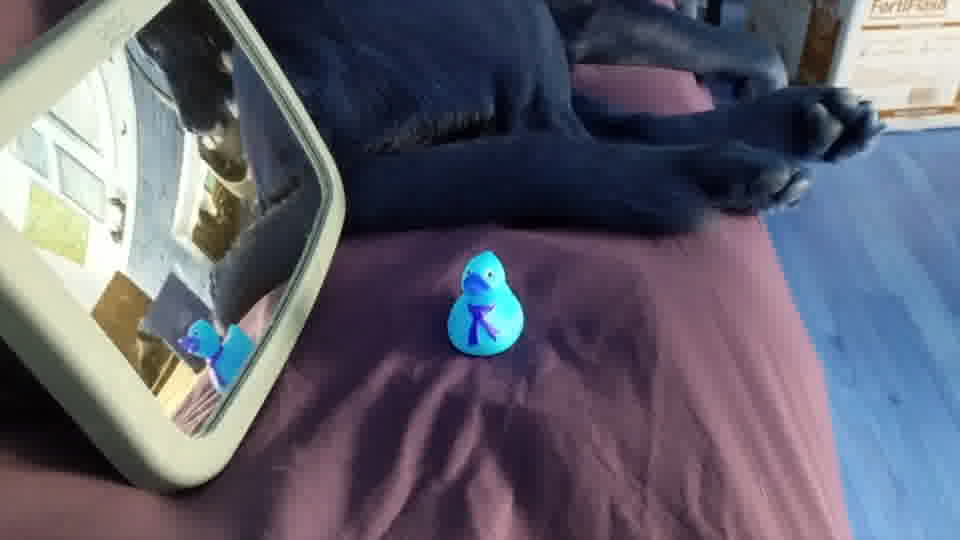

Running inference for /content/trainingdemo/images/test/out42.jpg... Done


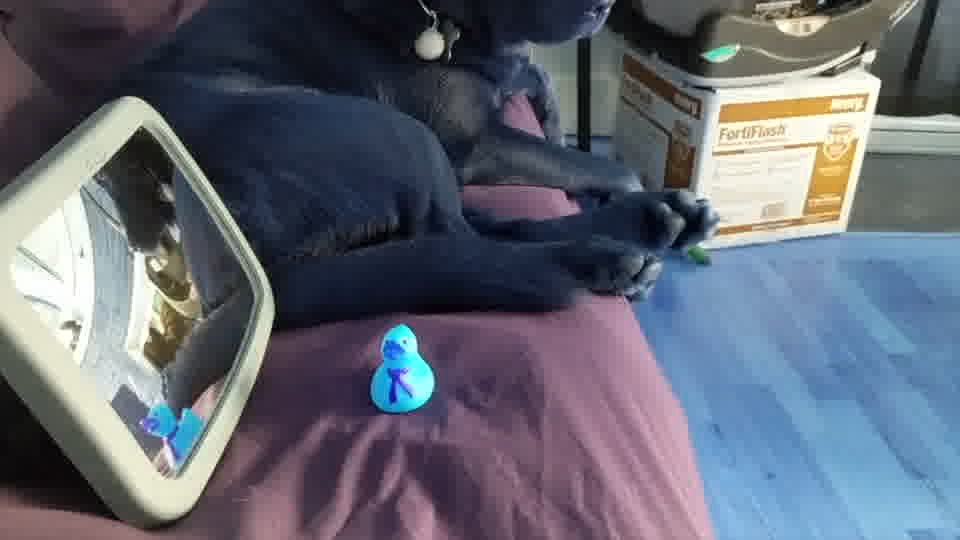

Running inference for /content/trainingdemo/images/test/out14.jpg... Done


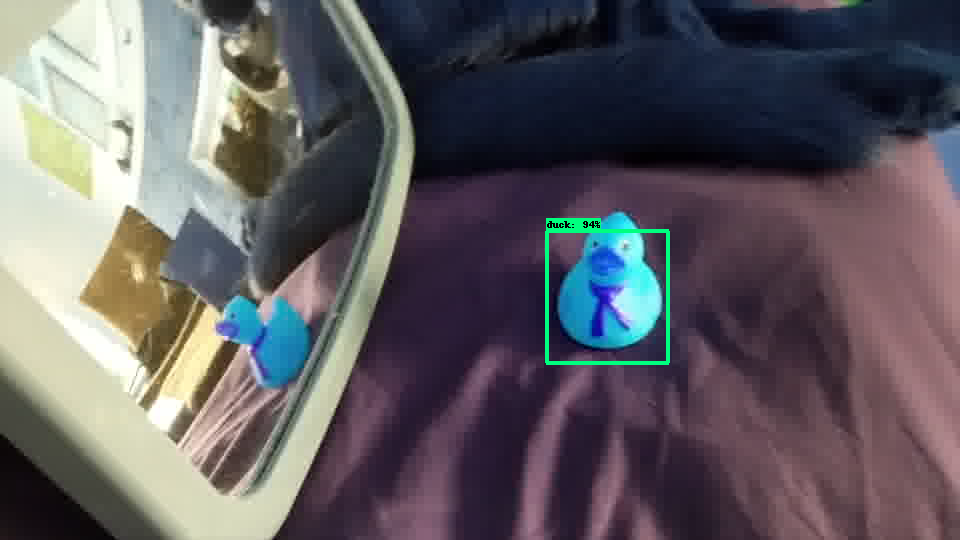

Running inference for /content/trainingdemo/images/test/out23.jpg... Done


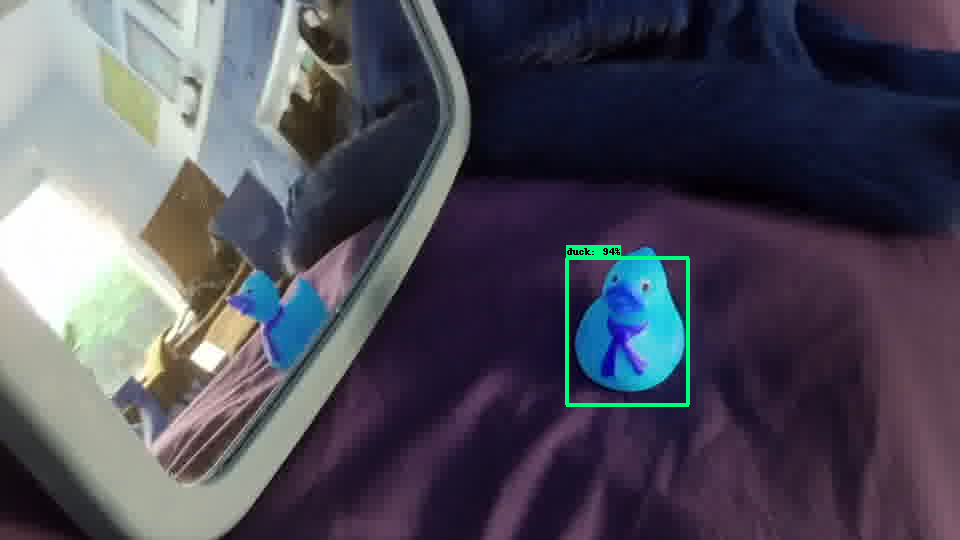

Running inference for /content/trainingdemo/images/test/out15.jpg... Done


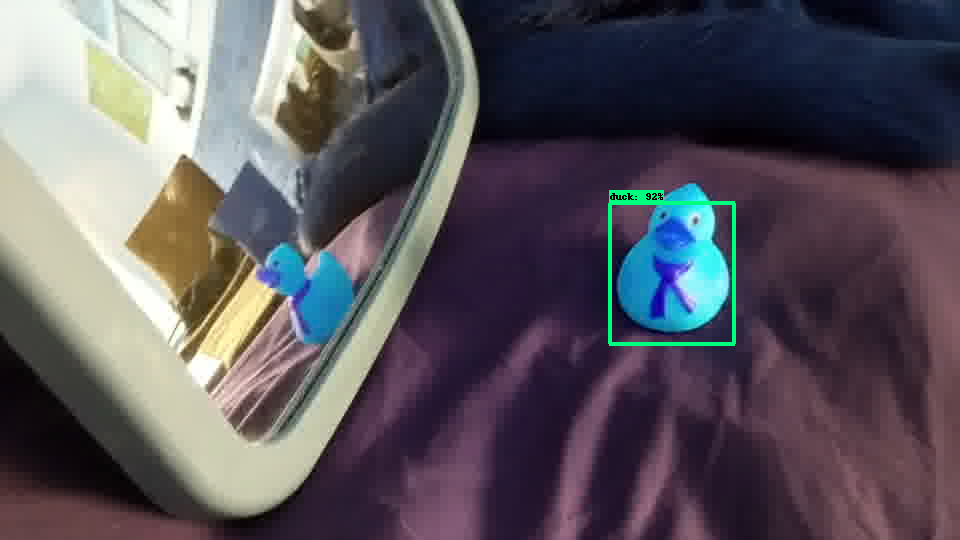

Running inference for /content/trainingdemo/images/test/out30.jpg... Done


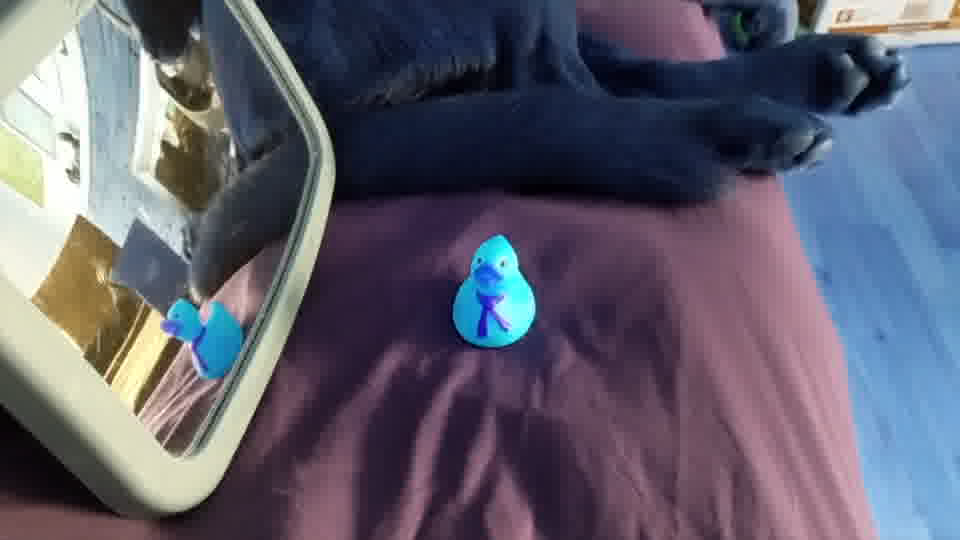

Running inference for /content/trainingdemo/images/test/out47.jpg... Done


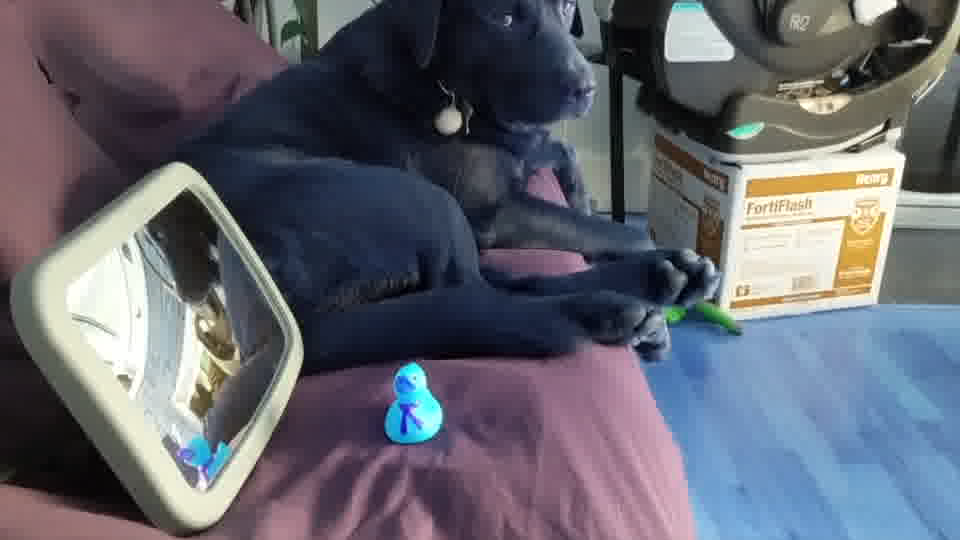

Running inference for /content/trainingdemo/images/test/out43.jpg... Done


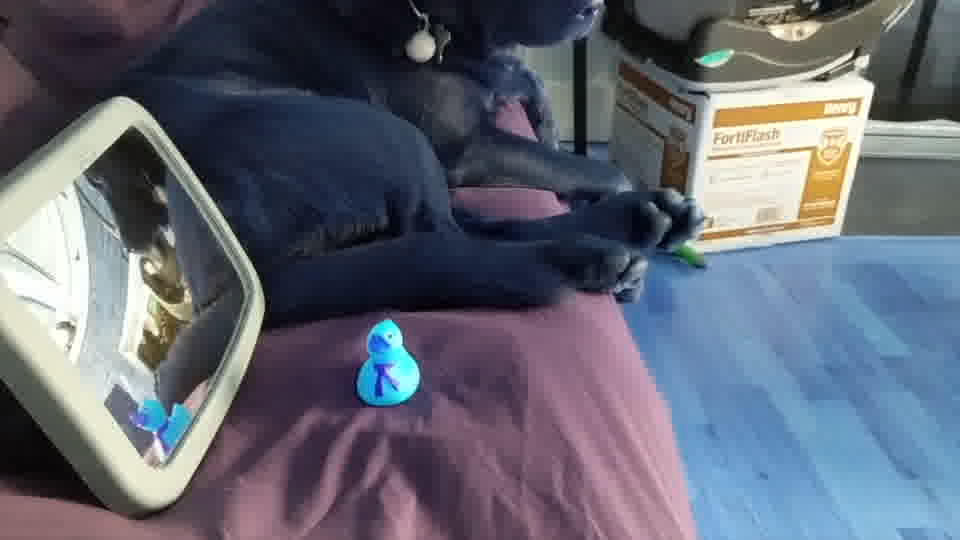

Running inference for /content/trainingdemo/images/test/out32.jpg... Done


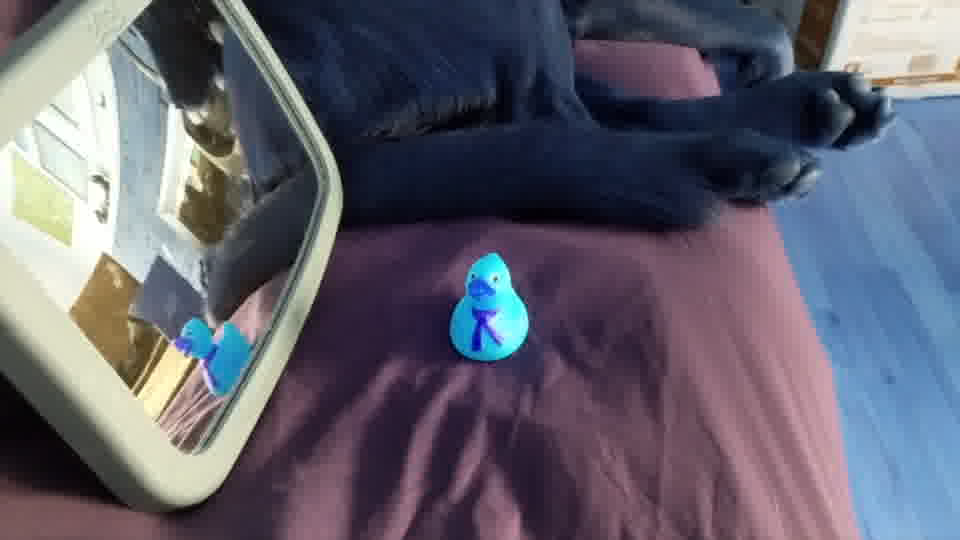

Running inference for /content/trainingdemo/images/test/out9.jpg... Done


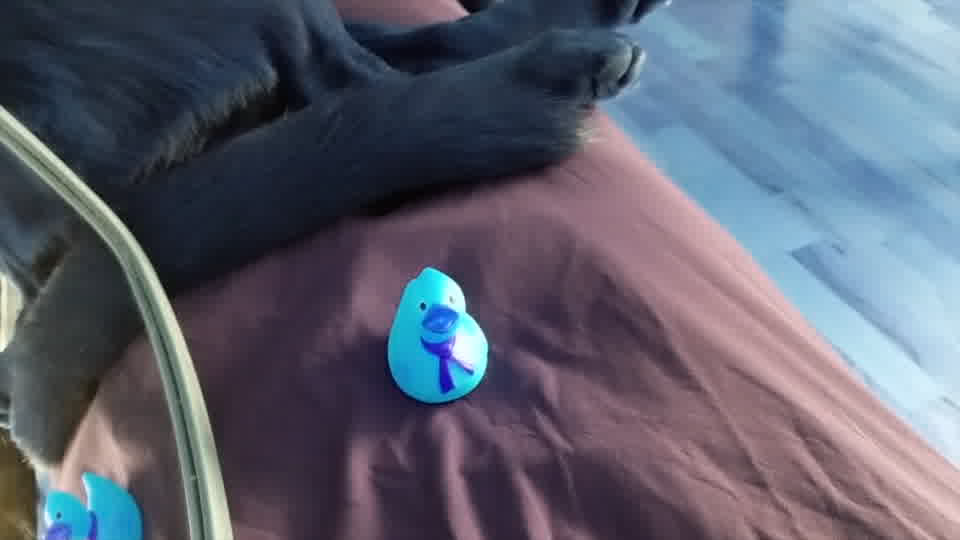

Running inference for /content/trainingdemo/images/test/out6.jpg... Done


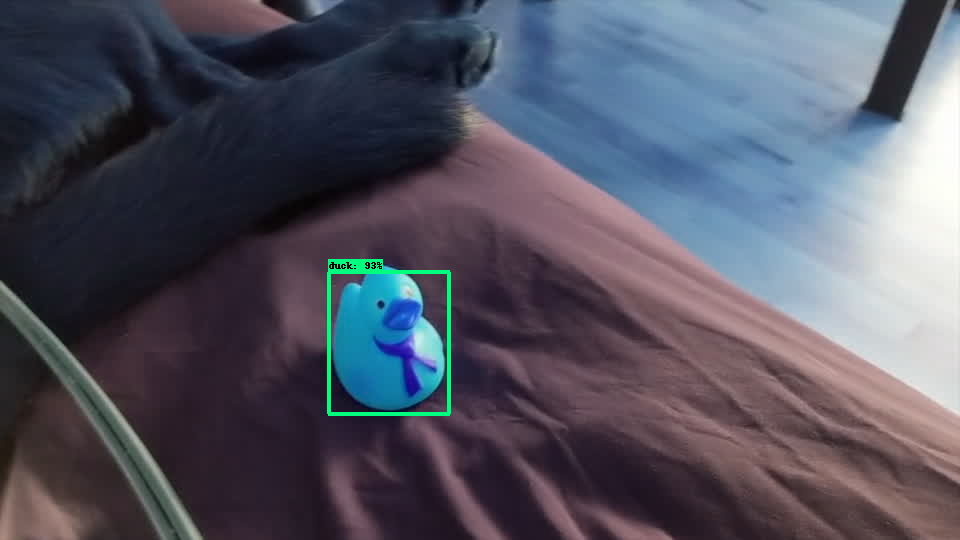

Running inference for /content/trainingdemo/images/test/out8.jpg... Done


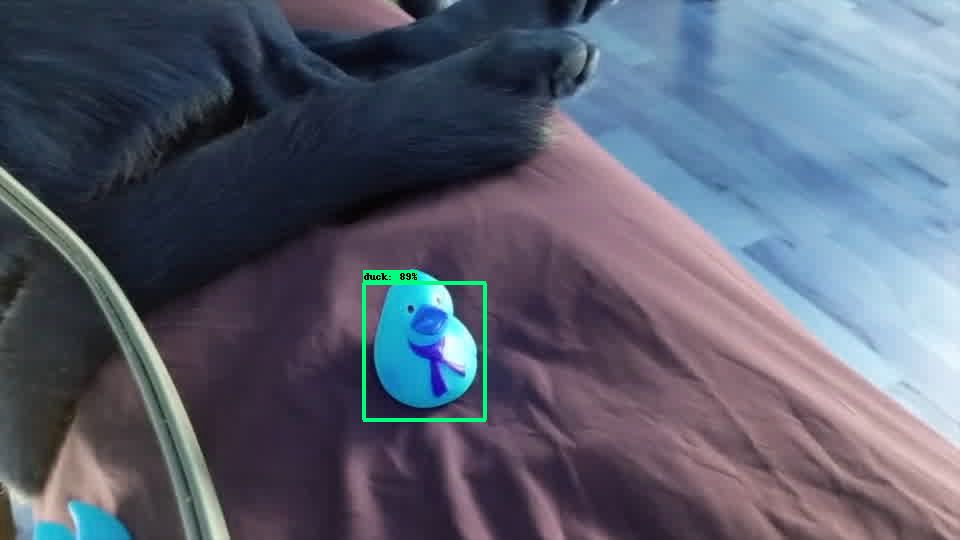

Running inference for /content/trainingdemo/images/test/out4.jpg... Done


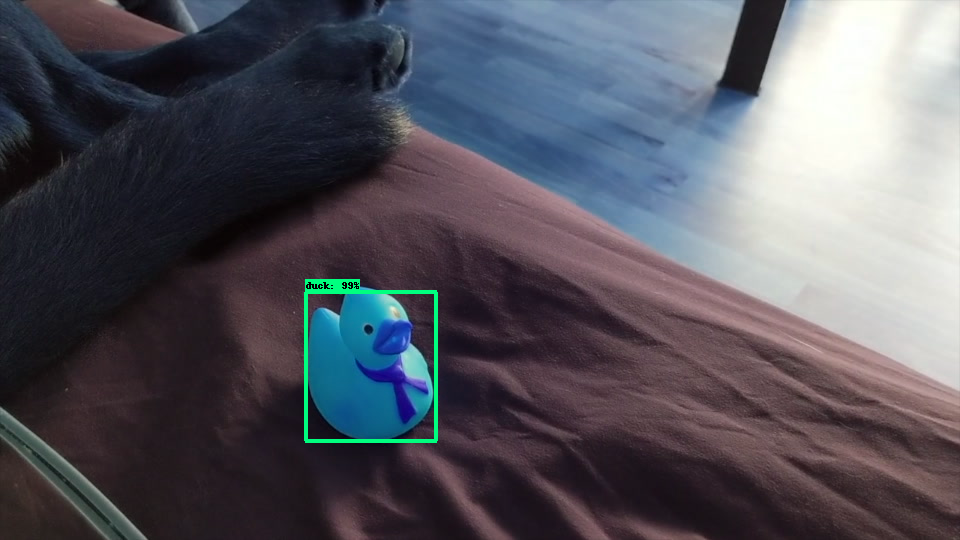

Running inference for /content/trainingdemo/images/test/out44.jpg... Done


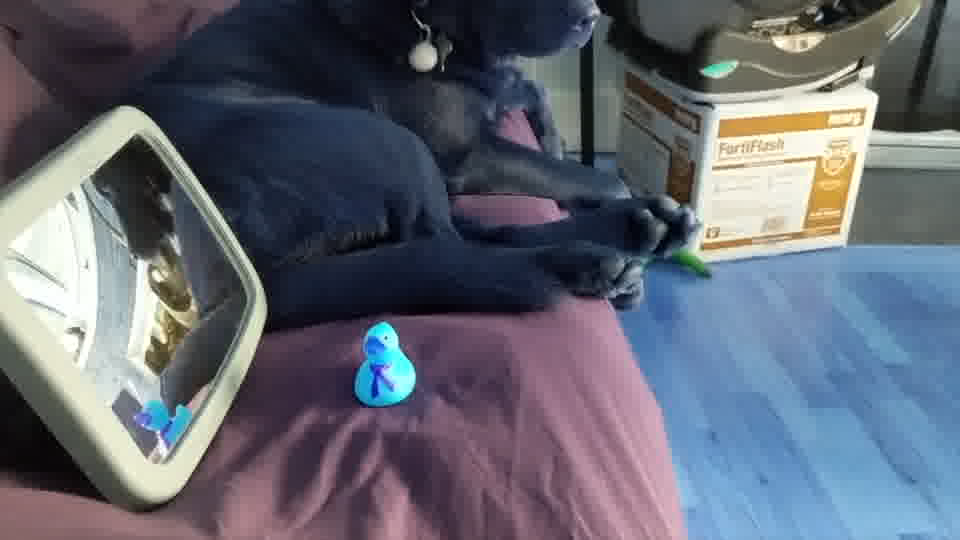

Running inference for /content/trainingdemo/images/test/out26.jpg... Done


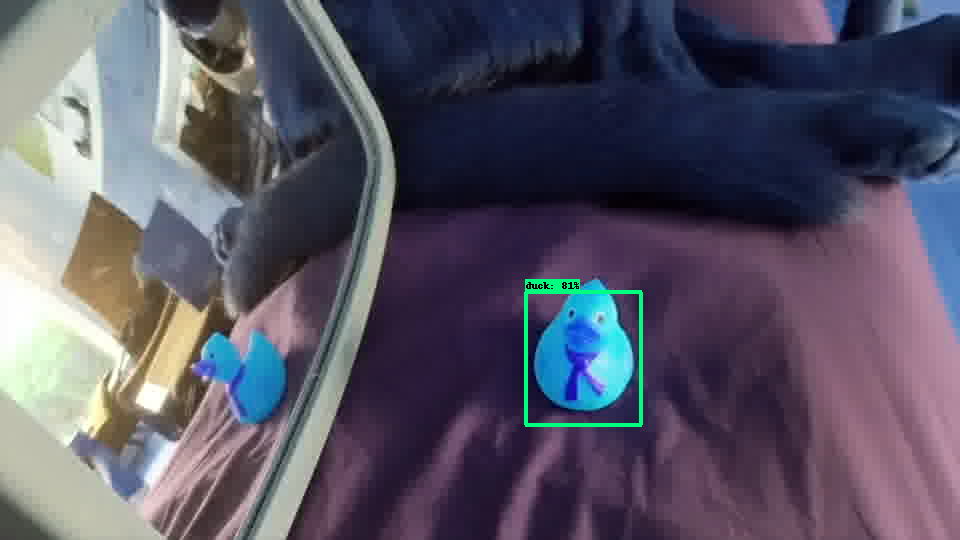

Running inference for /content/trainingdemo/images/test/out17.jpg... Done


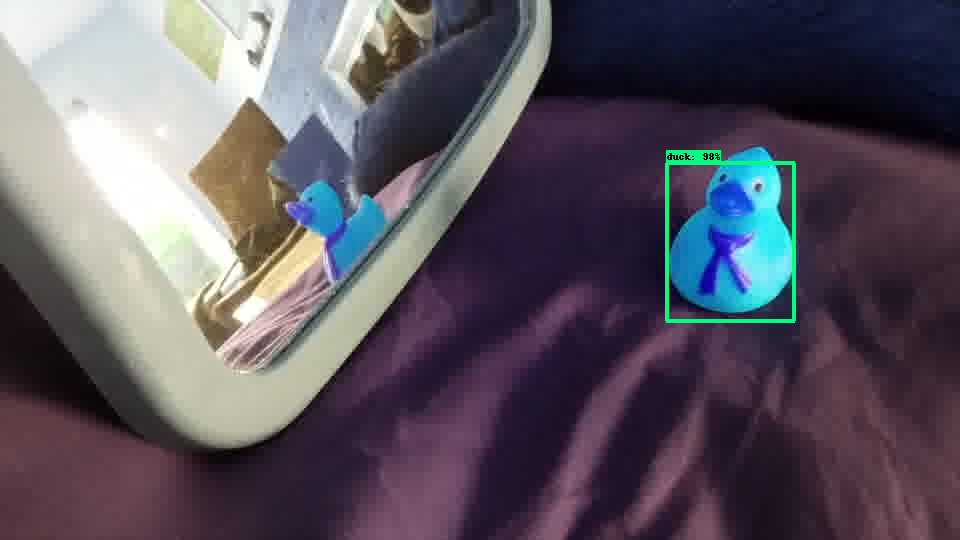

Running inference for /content/trainingdemo/images/test/out24.jpg... Done


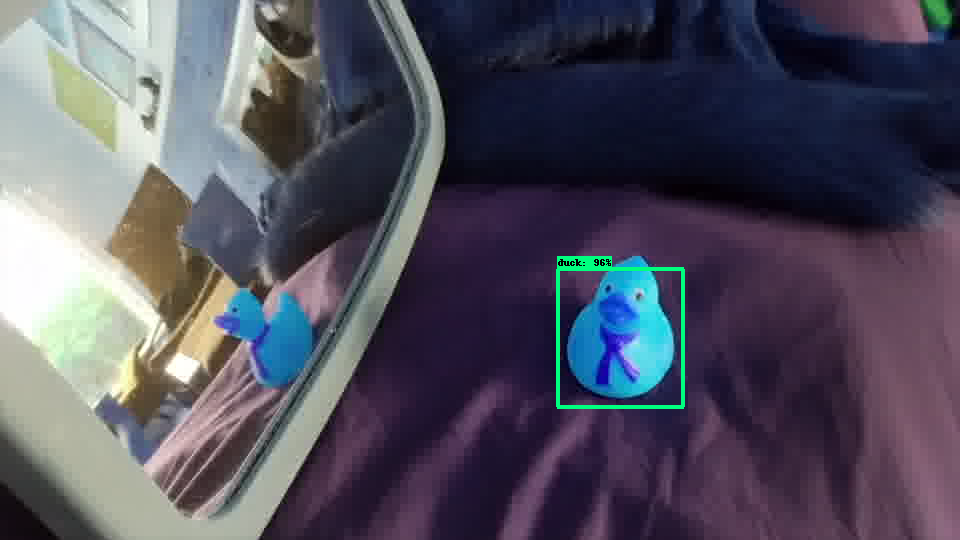

Running inference for /content/trainingdemo/images/test/out29.jpg... Done


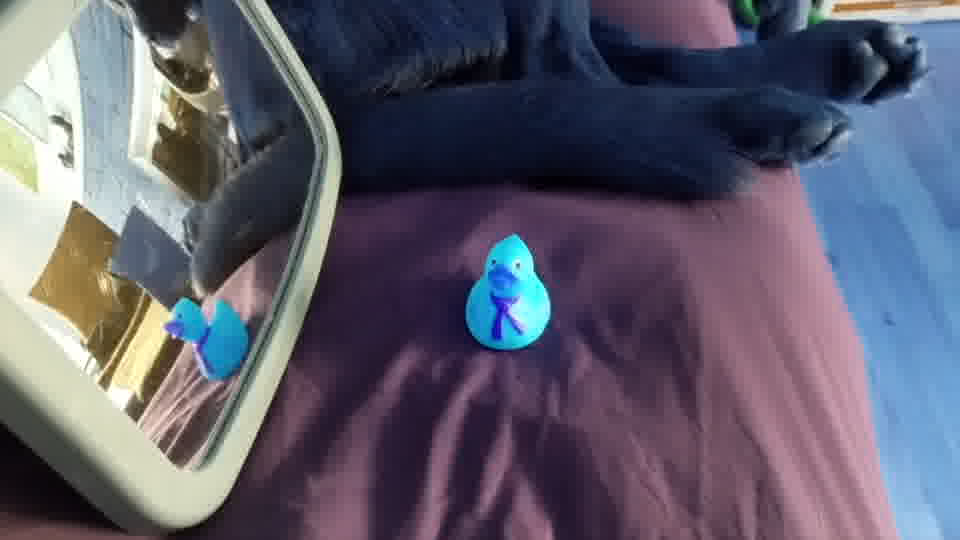

Running inference for /content/trainingdemo/images/test/out41.jpg... Done


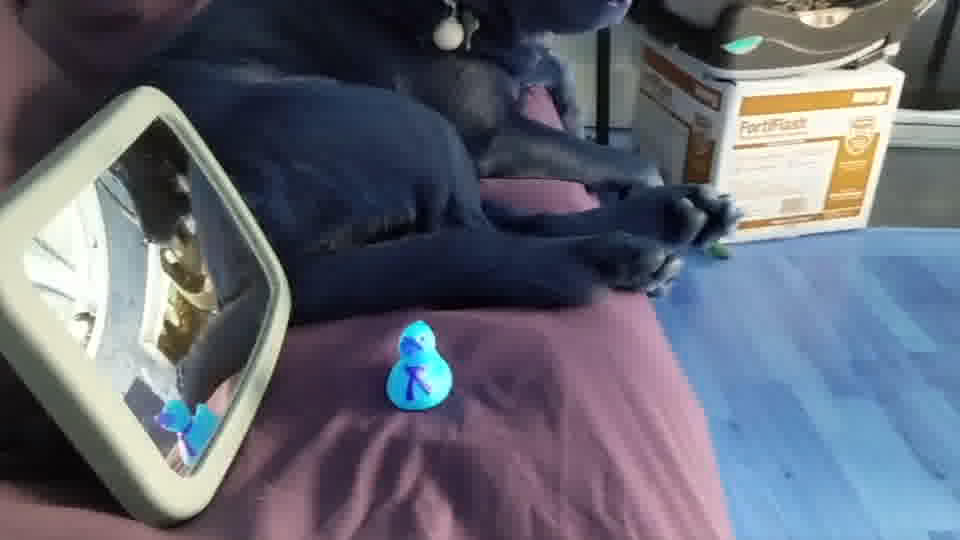

Running inference for /content/trainingdemo/images/test/out37.jpg... Done


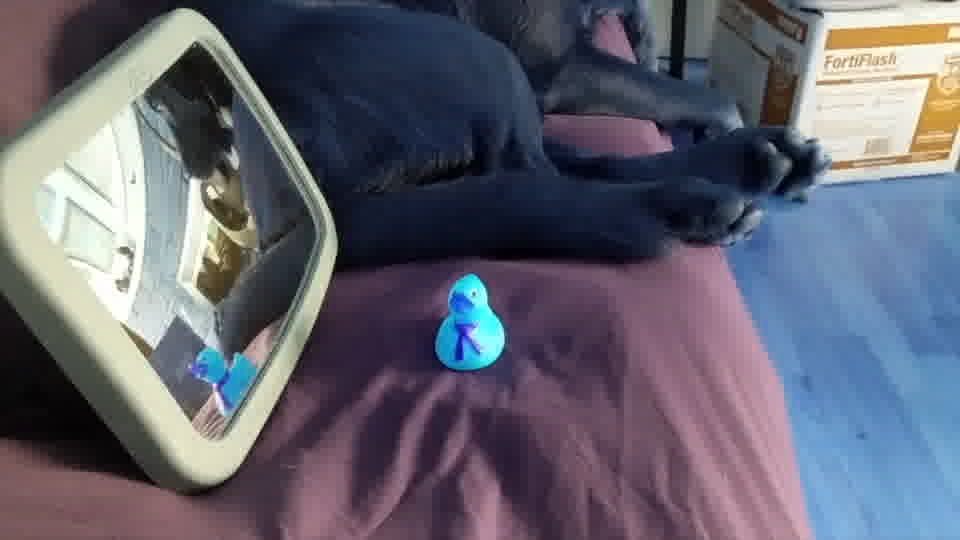

Running inference for /content/trainingdemo/images/test/out11.jpg... Done


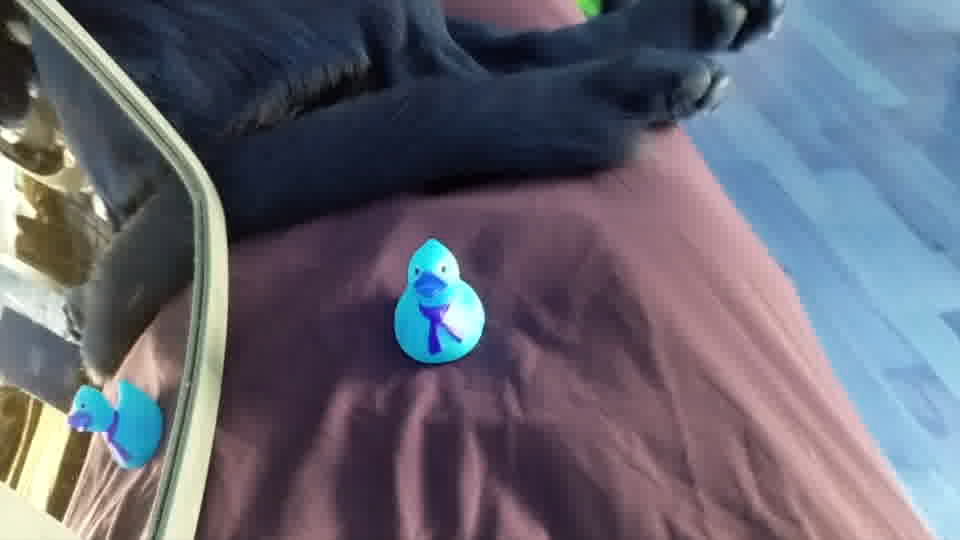

Running inference for /content/trainingdemo/images/test/out25.jpg... Done


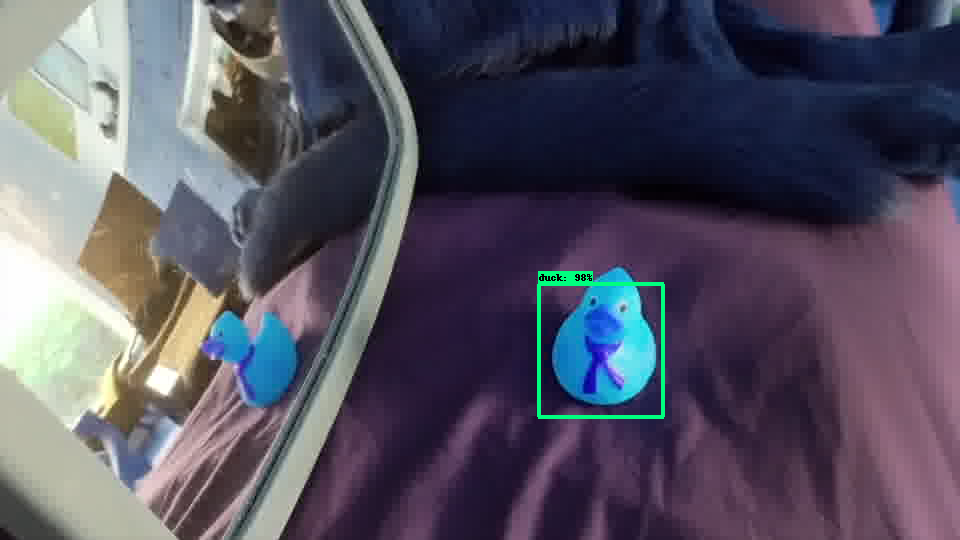

Running inference for /content/trainingdemo/images/test/out35.jpg... Done


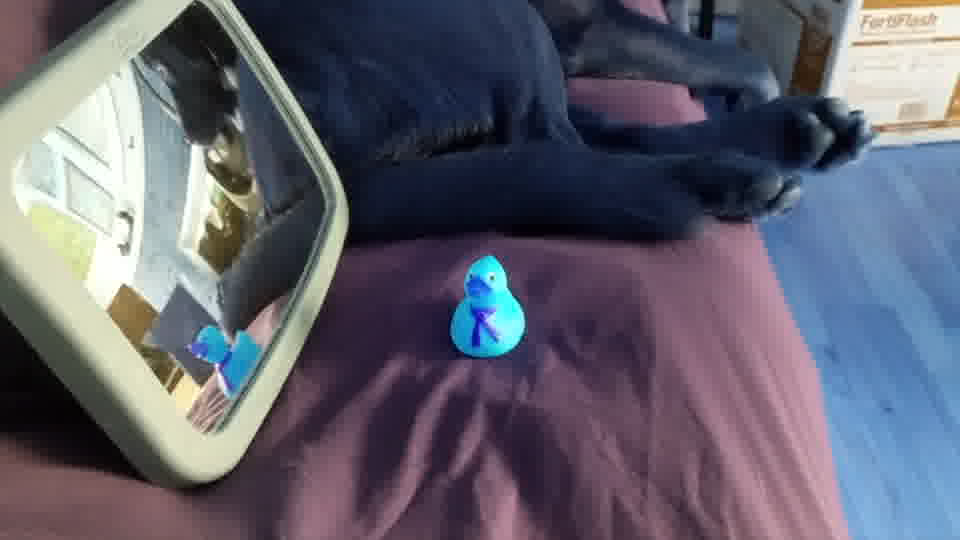

Running inference for /content/trainingdemo/images/test/out45.jpg... Done


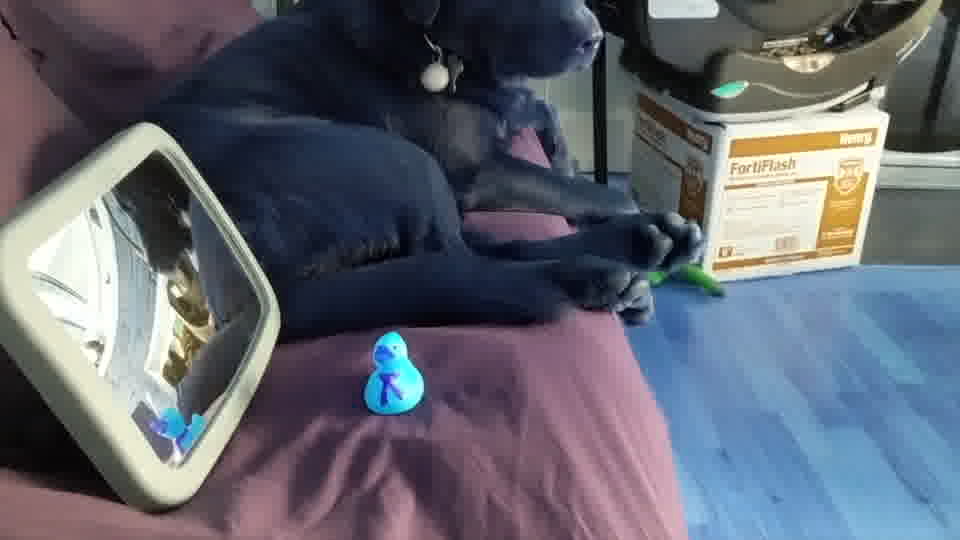

Running inference for /content/trainingdemo/images/test/out46.jpg... Done


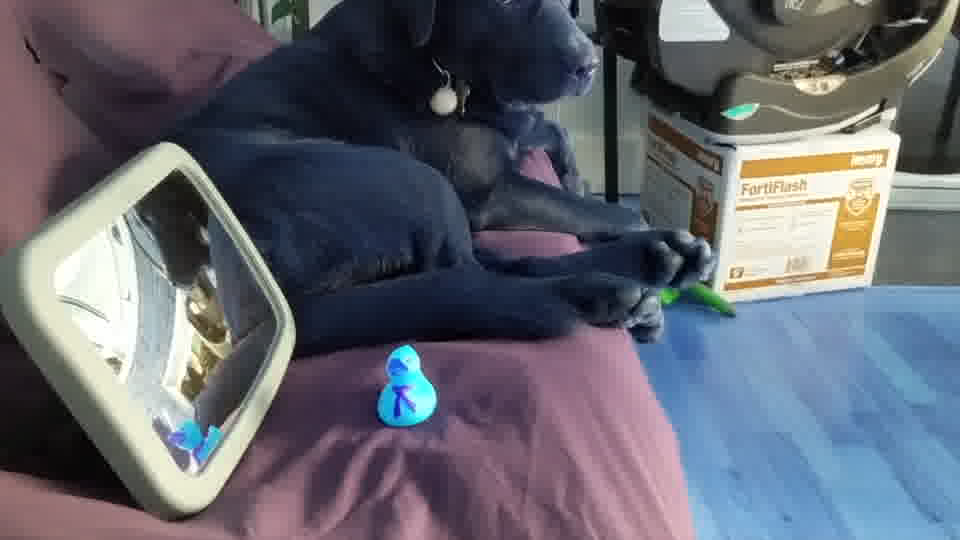

Running inference for /content/trainingdemo/images/test/out19.jpg... Done


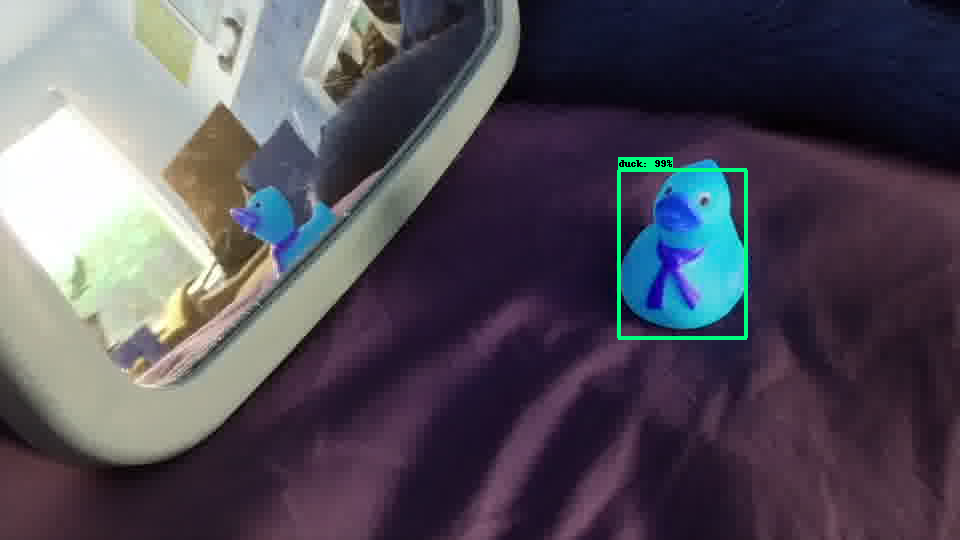

Running inference for /content/trainingdemo/images/test/out10.jpg... Done


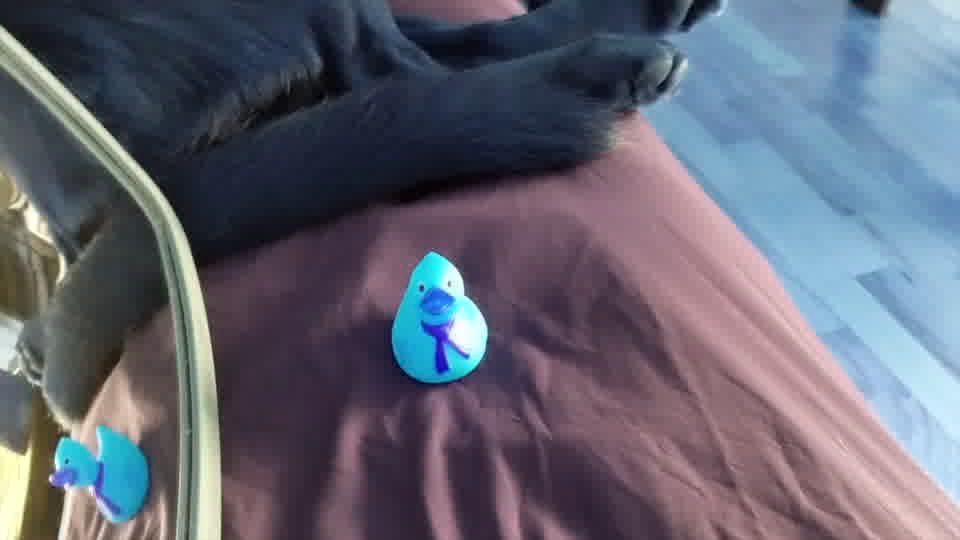

Running inference for /content/trainingdemo/images/test/out1.jpg... Done


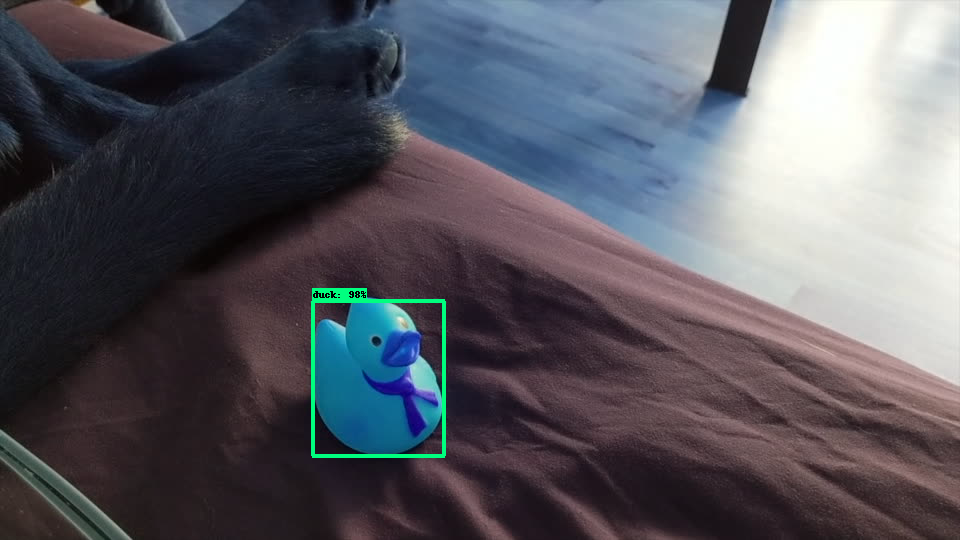

Running inference for /content/trainingdemo/images/test/out48.jpg... Done


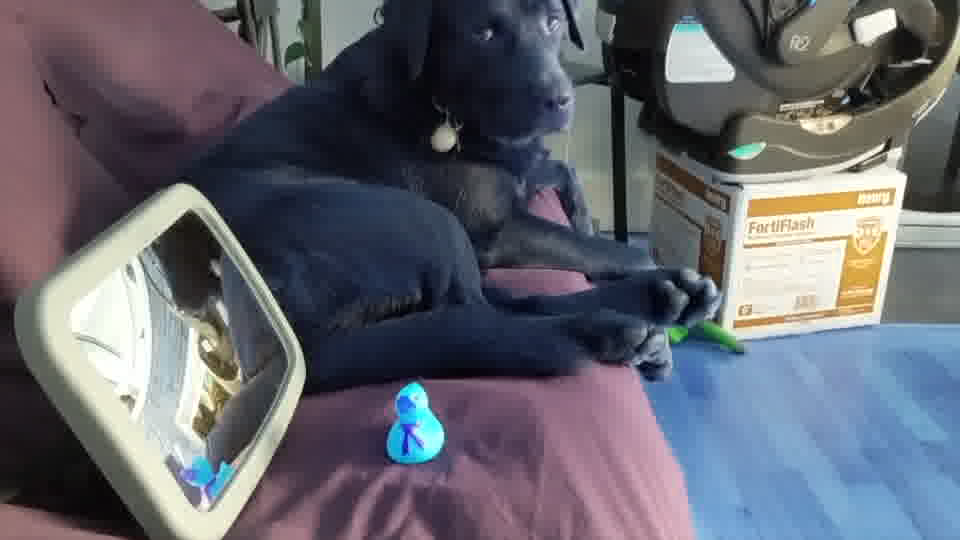

Running inference for /content/trainingdemo/images/test/out38.jpg... Done


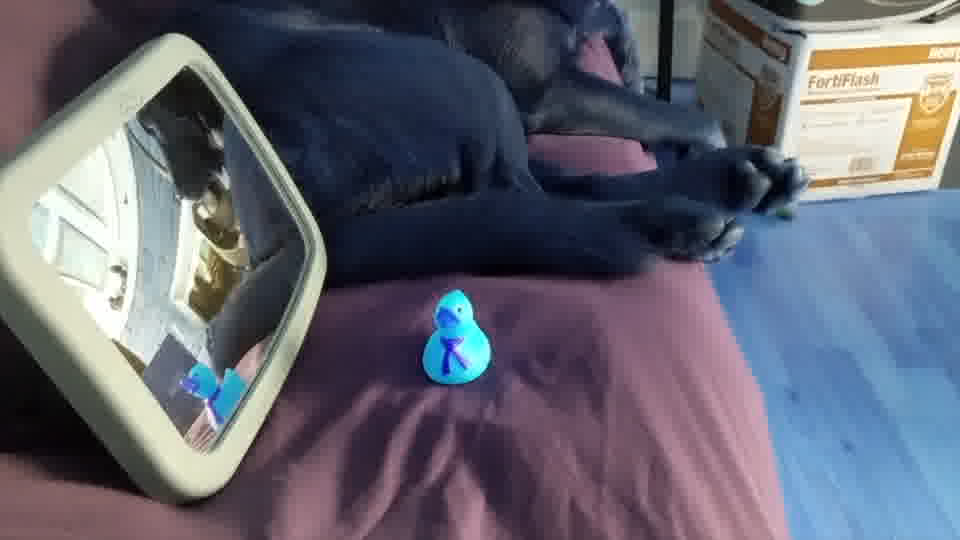

Running inference for /content/trainingdemo/images/test/out33.jpg... Done


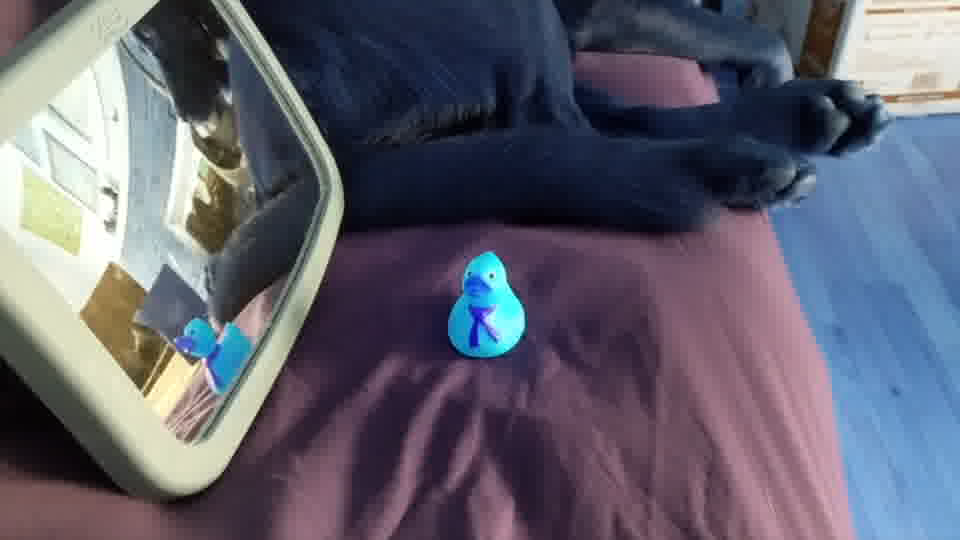

Running inference for /content/trainingdemo/images/test/out3.jpg... Done


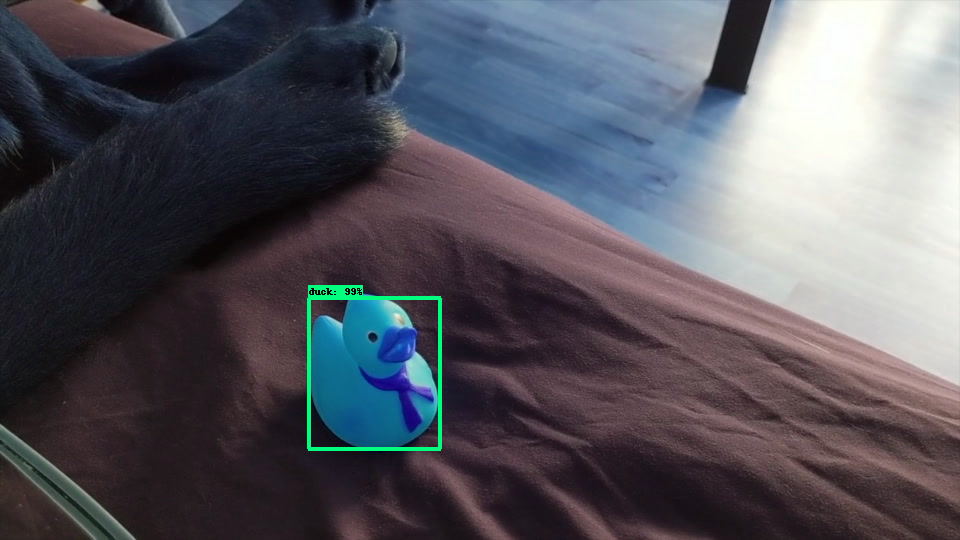

Running inference for /content/trainingdemo/images/test/out7.jpg... Done


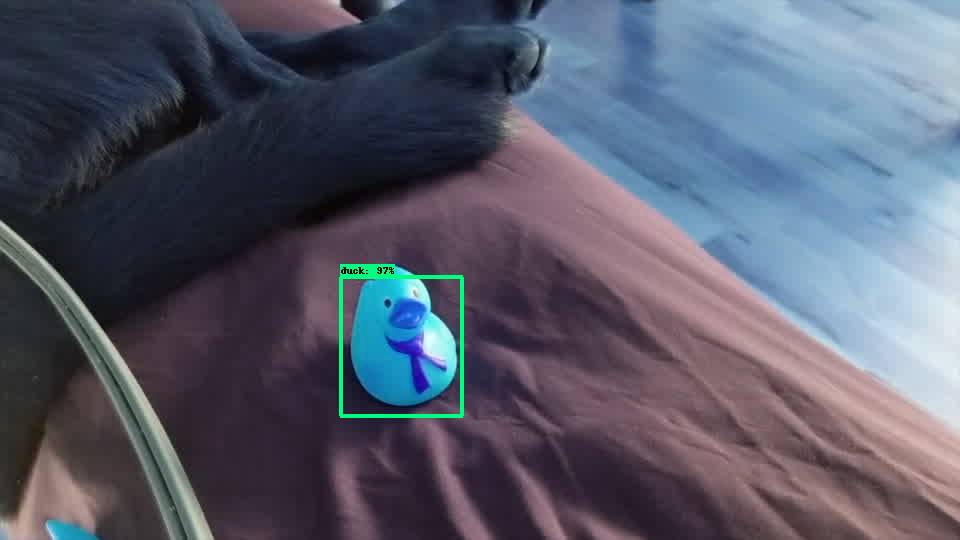

Running inference for /content/trainingdemo/images/test/out21.jpg... Done


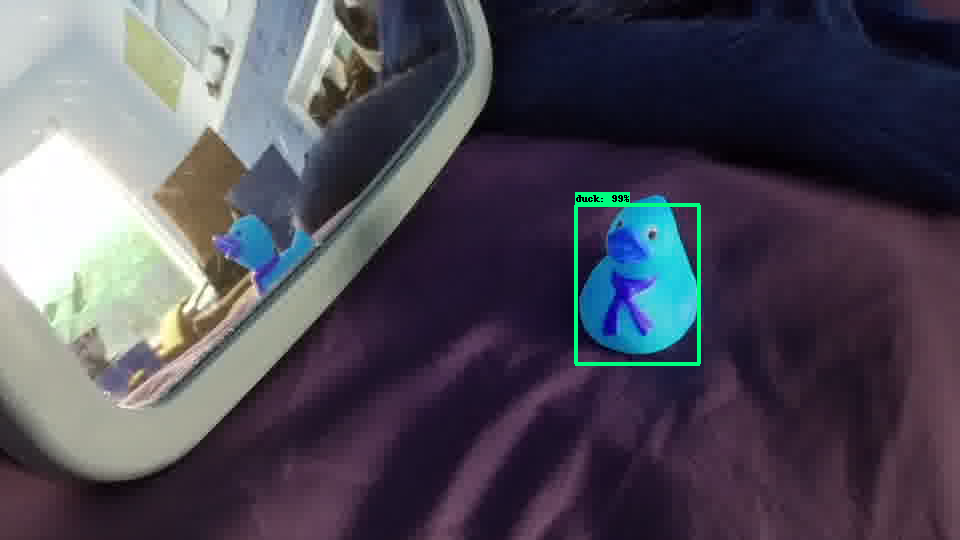

Running inference for /content/trainingdemo/images/test/out22.jpg... Done


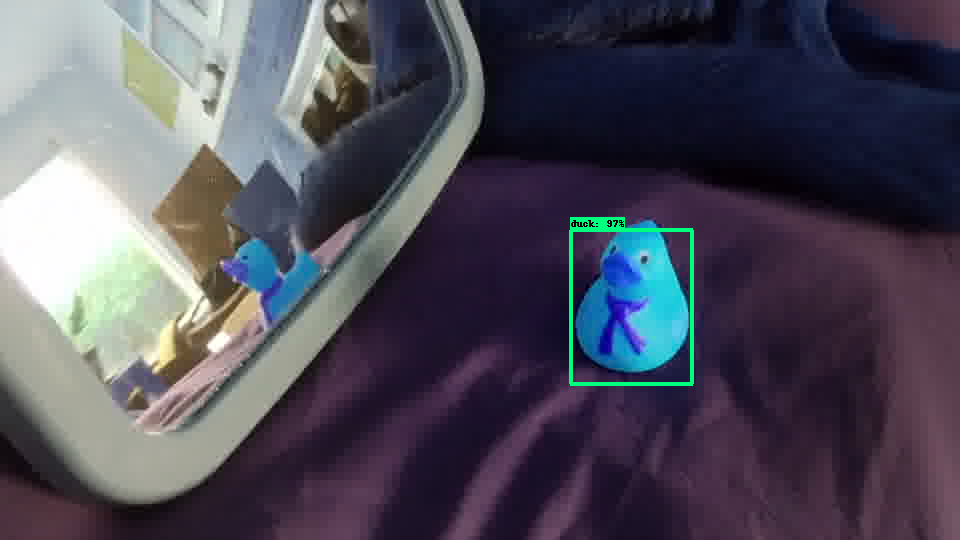

Running inference for /content/trainingdemo/images/test/out5.jpg... Done


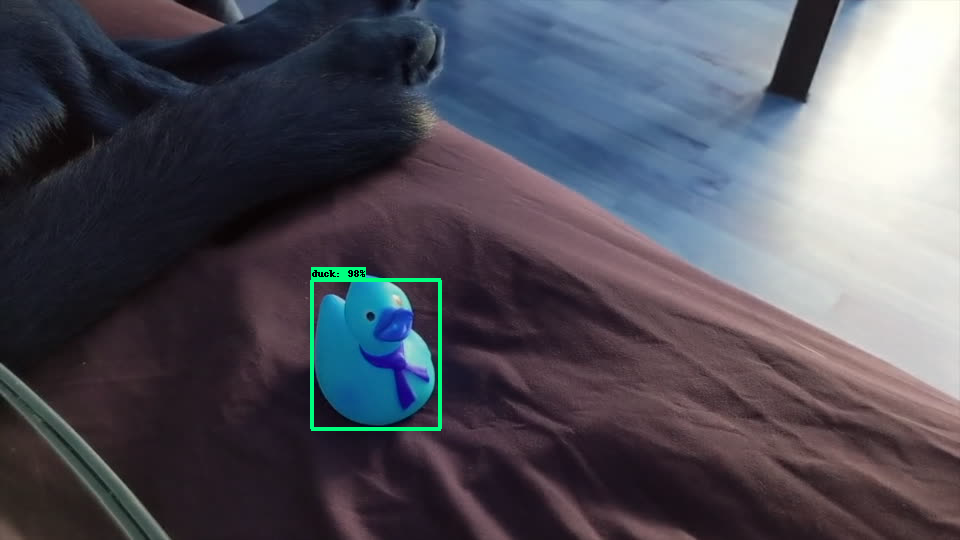

Running inference for /content/trainingdemo/images/test/out39.jpg... Done


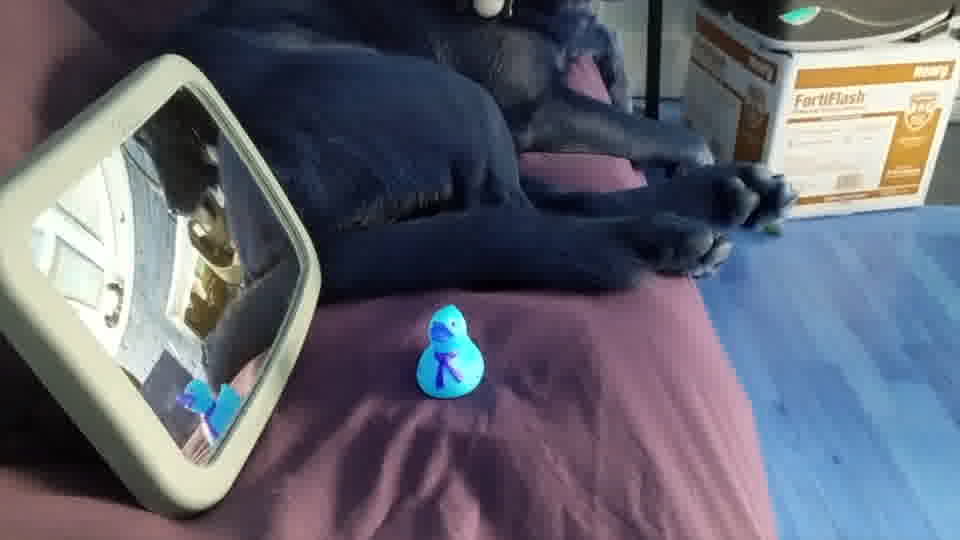

Running inference for /content/trainingdemo/images/test/out16.jpg... Done


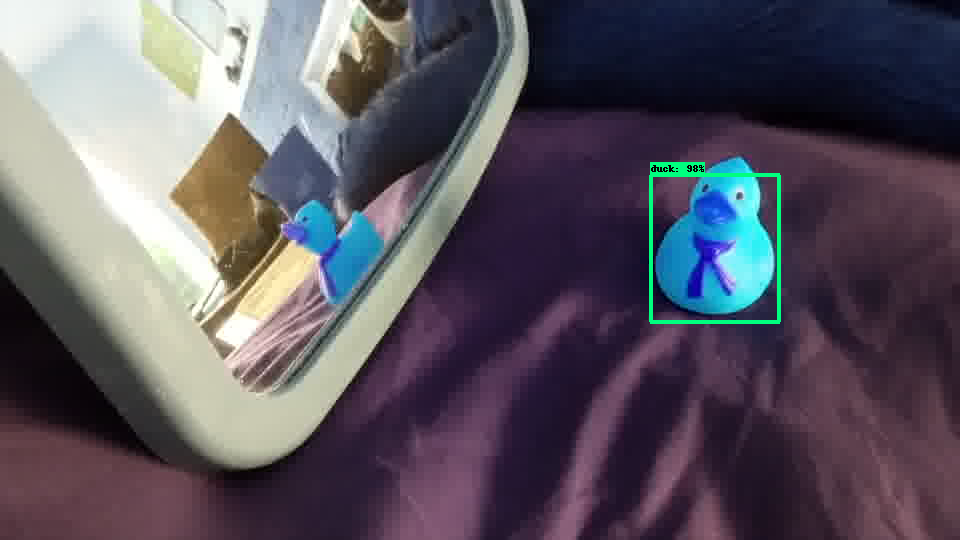

Running inference for /content/trainingdemo/images/test/out27.jpg... Done


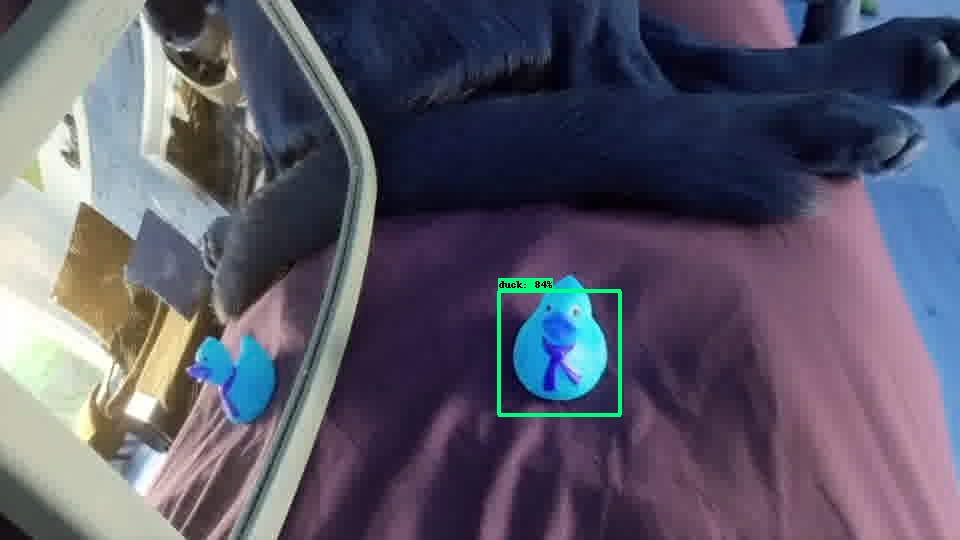

Running inference for /content/trainingdemo/images/test/out49.jpg... Done


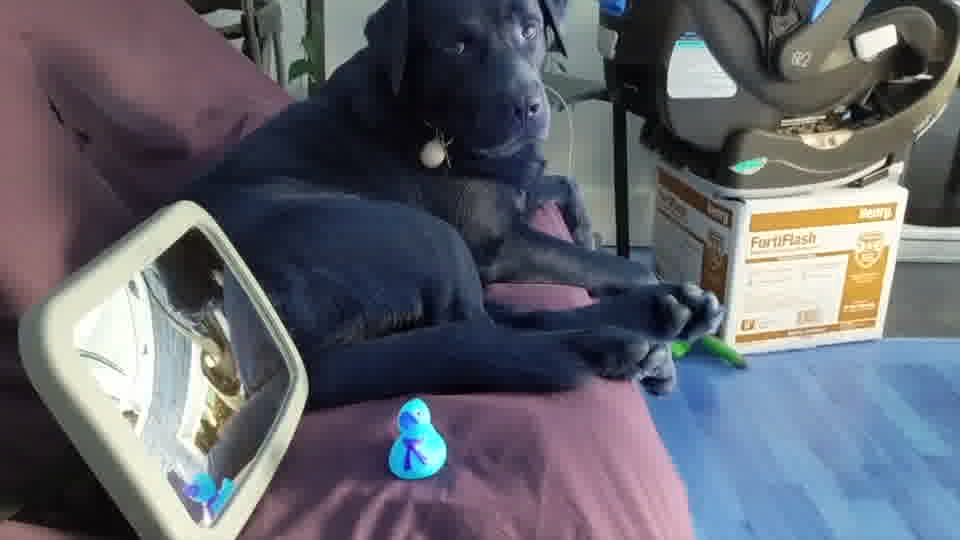

Running inference for /content/trainingdemo/images/test/out13.jpg... Done


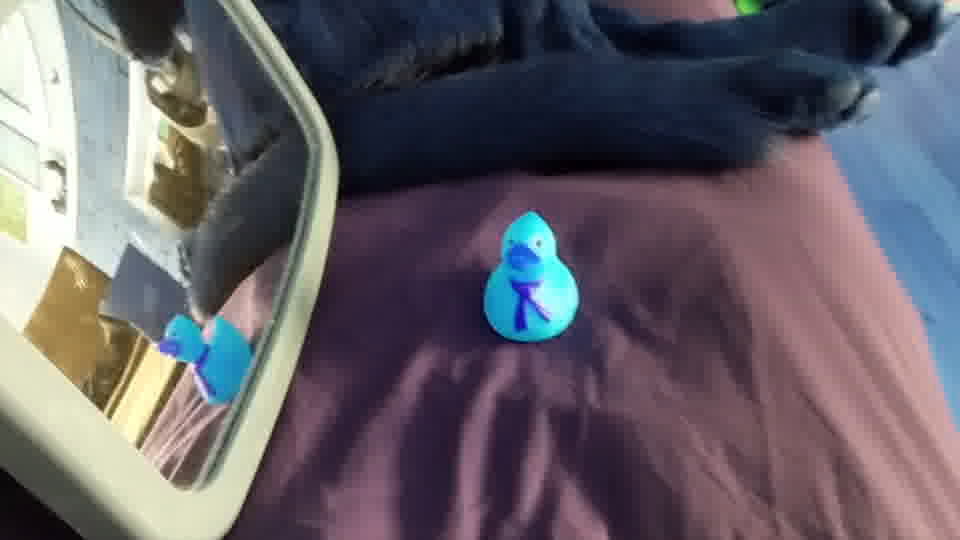

Running inference for /content/trainingdemo/images/test/out20.jpg... Done


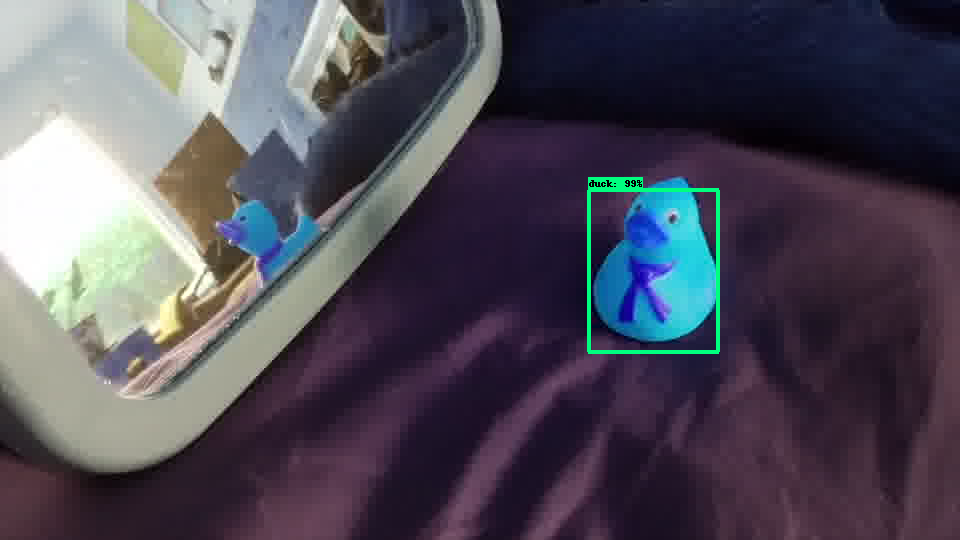

Running inference for /content/trainingdemo/images/test/out28.jpg... Done


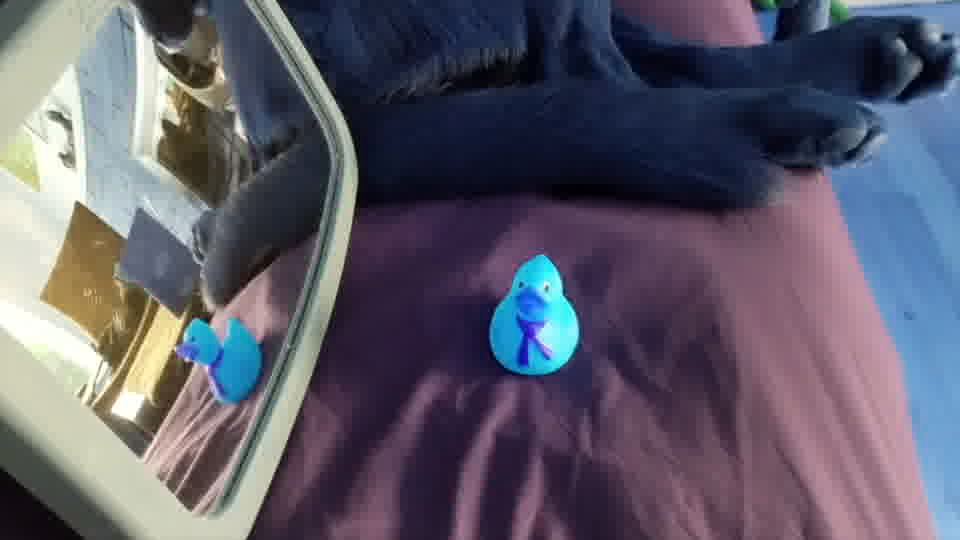

Running inference for /content/trainingdemo/images/test/out12.jpg... Done


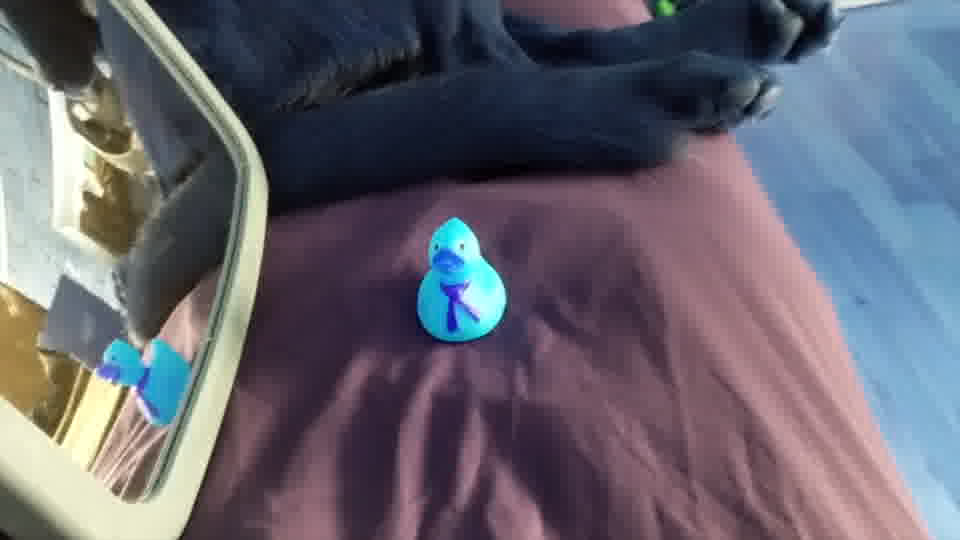

Running inference for /content/trainingdemo/images/test/out31.jpg... Done


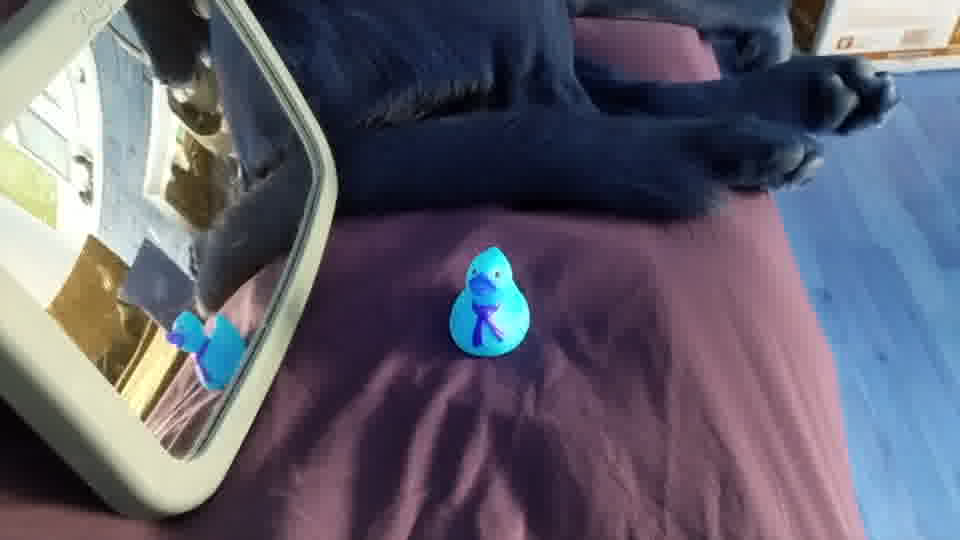

Running inference for /content/trainingdemo/images/test/out2.jpg... Done


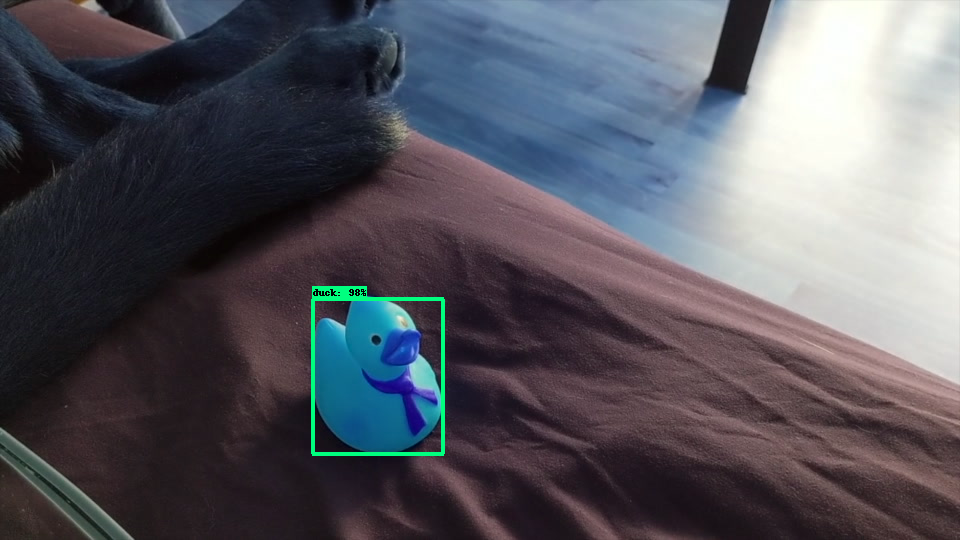

Running inference for /content/trainingdemo/images/test/out36.jpg... Done


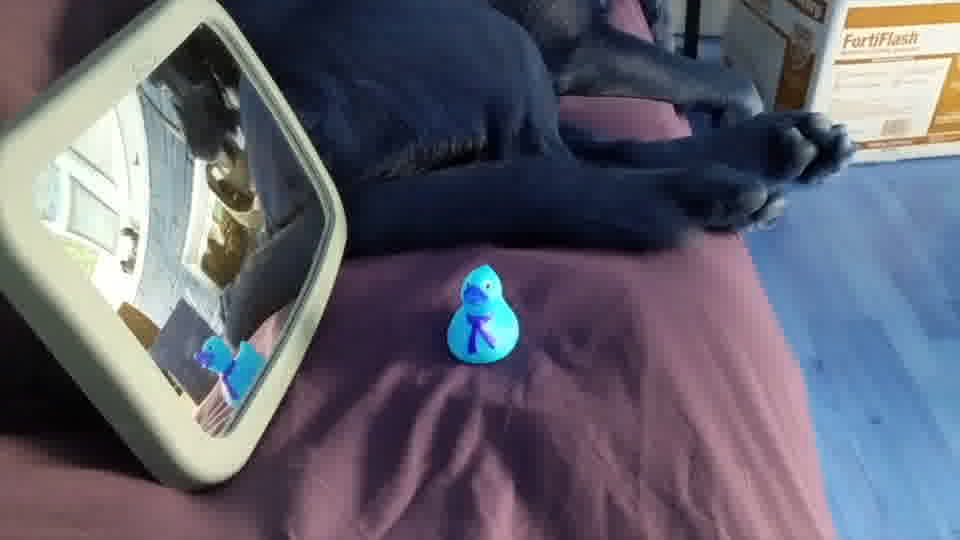

Running inference for /content/trainingdemo/images/test/out18.jpg... Done


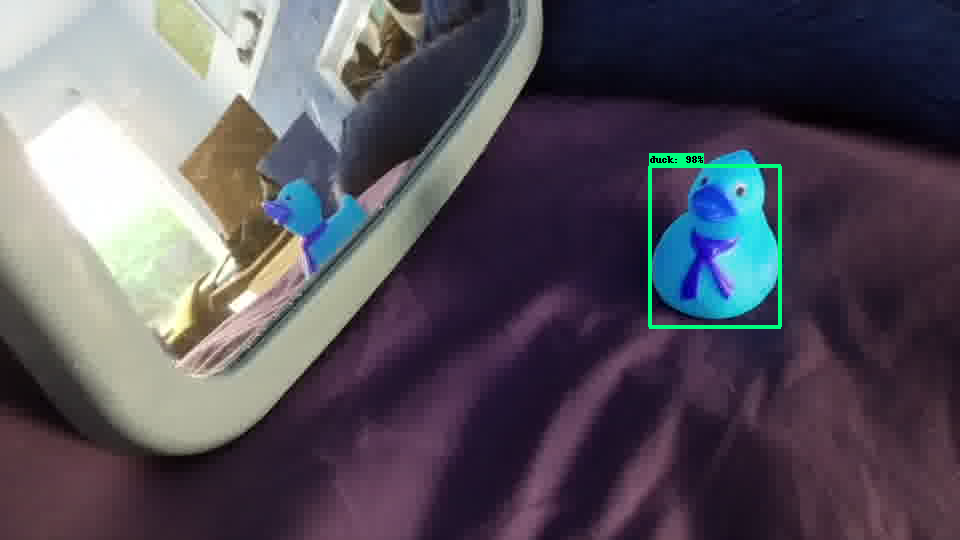

Running inference for /content/trainingdemo/images/test/out40.jpg... Done


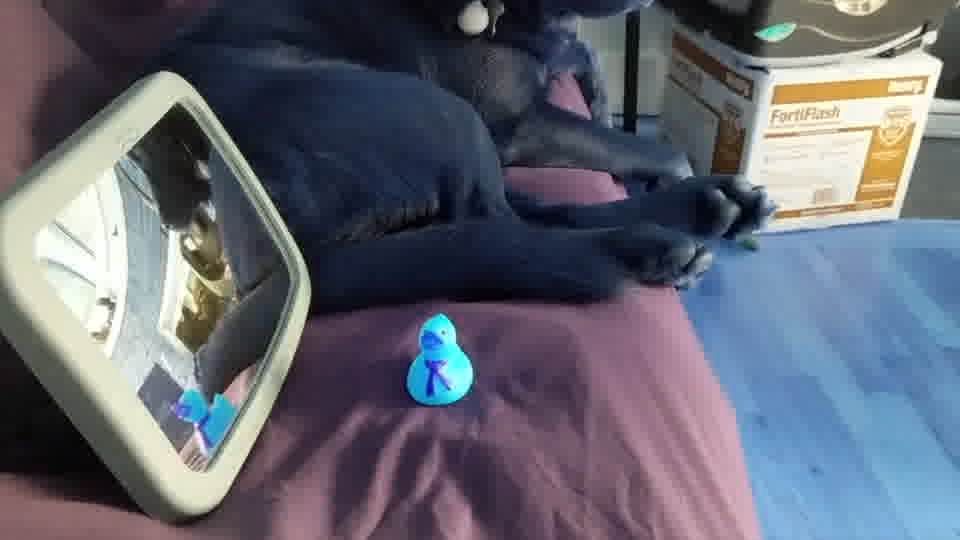

In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))


for image_path in IMAGE_PATH:

    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    # image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)

    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                  for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    label_id_offset = 1
    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes']+label_id_offset,
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=200,
            min_score_thresh=.65,
            agnostic_mode=False)

    print('Done')

    cv2_imshow(image_np_with_detections)
    plt.figure()
  
